# Capstone Project- Battle of the Neighbourhoods

## Business Problem

Due to COVID-19 the prices of the real estate/property have been affected significantly.It is fairly clear that with massive unemployment, wage cuts, business failures, and job uncertainty, many people are likely to be cautious about making the biggest investment of their lives - buying a home.
This project will be focused on how it can help the customers as well as the realtor to choose a house/estate that is convenient and worth the investment being made.

## Target Audience

The target audience for this project are:-

    1)Customers who are thinkinng of buying a real estate and want to have a good/valuable investment.

    2)Realtors who want to recommend their customers the ideal property that is within their budget and is worth it.

    3)Data scientists that are interested in the same topic of using location data to explore a geographical location.

## About the Data 

Data on London properties and the relative price paid data are extracted from the HM Land Registry (http://landregistry.data.gov.uk/). The following fields comprise the address data included in Price Paid Data: Postcode; PAON Primary Addressable Object Name. Typically the house number or name; SAON Secondary Addressable Object Name. If there is a sub-building, for example, the building is divided into flats, there will be a SAON; Street; Locality; Town/City; District; County.

To explore and target the recommended locations across different venues according to the presence of amenities and essential facilities, we will access data through FourSquare API interface and arrange them as a dataframe for visualization. By merging data on London properties and the relative price paid data from the HM Land Registry and data on amenities and essential facilities surrounding such properties from FourSquare API interface, we will be able to recommend relevant and profitable real estate investments.

## Methodology

The Methodology section will describe the main components of our analysis and predication system. The Methodology section comprises four stages:

1. Collecting relevant Data and importing relevant libraries
2. Explore and Understand Data
3. Data preparation and preprocessing 
4. Modeling

### 1) Collecting relevant Data and importing relevant libraries

#### Downloading Property data for UK for the year 2020

In [6]:
!wget -O london.csv http://prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2020.csv

--2020-08-01 04:10:32--  http://prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2020.csv
Resolving prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com (prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com)... 52.218.106.124
Connecting to prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com (prod.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com)|52.218.106.124|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://prod1.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2020.csv [following]
--2020-08-01 04:10:33--  http://prod1.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com/pp-2020.csv
Resolving prod1.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com (prod1.publicdata.landregistry.gov.uk.s3-website-eu-west-1.amazonaws.com)... 52.218.100.12
Connecting to prod1.publicdata.landregistry.gov.uk.s3-webs

#### Importing Dependecies

In [5]:
import pandas as pd
from geopy.geocoders import Nominatim
!pip install folium
import folium
!pip install requests
import requests
from pandas import DataFrame
import numpy as np
from sklearn.metrics import silhouette_score
!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.cm as cm
import matplotlib.colors as colors

     |████████████████████████████████| 102kB 5.6MB/s ta 0:00:01
     |████████████████████████████████| 266kB 8.4MB/s eta 0:00:01


### 2) Explore and Understand Data

In [7]:
london=pd.read_csv('london.csv')
london.head()

,{A2479555-3559-74C7-E053-6B04A8C0887D},299950,2020-01-31 00:00,EX17 3FL,S,Y,F,7,Unnamed: 8,YEO CRESCENT,Unnamed: 10,CREDITON,MID DEVON,DEVON,A,A.1
0,{A2479555-5A44-74C7-E053-6B04A8C0887D},280000,2020-02-28 00:00,B60 1DU,T,N,F,21,NaN,COTTAGE LANE,MARLBROOK,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
1,{A2479555-5A46-74C7-E053-6B04A8C0887D},267000,2020-03-03 00:00,WR5 2PB,S,N,F,16,NaN,REGIMENT CLOSE,BROOMHALL,WORCESTER,WYCHAVON,WORCESTERSHIRE,A,A
2,{A2479555-5A47-74C7-E053-6B04A8C0887D},164000,2020-02-28 00:00,HR2 7DD,T,N,F,14,NaN,WATERFIELD ROAD,NaN,HEREFORD,HEREFORDSHIRE,HEREFORDSHIRE,A,A
3,{A2479555-5A48-74C7-E053-6B04A8C0887D},72500,2020-02-21 00:00,B61 8AB,F,N,L,"ST. JAMES COURT, 30",FLAT 11,THE STRAND,NaN,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
4,{A2479555-5A49-74C7-E053-6B04A8C0887D},200000,2020-02-21 00:00,B61 0NP,S,N,F,128,NaN,MAYFIELD CLOSE,CATSHILL,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A


In [8]:
london.shape

(207355, 16)

The dataset has 207355 rows and 16 columns.

### 3) Data preparation and preprocessing

#### Renaming the columns for better understanding and convenience

In [4]:
london.columns=['TUID', 'Price', 'Date_Transfer', 'Postcode', 'Prop_Type', 'Old_New', 'Duration', 'PAON','SAON', 'Street', 'Locality', 'Town_City', 'District', 'County', 'PPD_Cat_Type', 'Record_Status']

In [5]:
london.head()

,TUID,Price,Date_Transfer,Postcode,Prop_Type,Old_New,Duration,PAON,SAON,Street,Locality,Town_City,District,County,PPD_Cat_Type,Record_Status
0,{A2479555-5A44-74C7-E053-6B04A8C0887D},280000,2020-02-28 00:00,B60 1DU,T,N,F,21,NaN,COTTAGE LANE,MARLBROOK,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
1,{A2479555-5A46-74C7-E053-6B04A8C0887D},267000,2020-03-03 00:00,WR5 2PB,S,N,F,16,NaN,REGIMENT CLOSE,BROOMHALL,WORCESTER,WYCHAVON,WORCESTERSHIRE,A,A
2,{A2479555-5A47-74C7-E053-6B04A8C0887D},164000,2020-02-28 00:00,HR2 7DD,T,N,F,14,NaN,WATERFIELD ROAD,NaN,HEREFORD,HEREFORDSHIRE,HEREFORDSHIRE,A,A
3,{A2479555-5A48-74C7-E053-6B04A8C0887D},72500,2020-02-21 00:00,B61 8AB,F,N,L,"ST. JAMES COURT, 30",FLAT 11,THE STRAND,NaN,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
4,{A2479555-5A49-74C7-E053-6B04A8C0887D},200000,2020-02-21 00:00,B61 0NP,S,N,F,128,NaN,MAYFIELD CLOSE,CATSHILL,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A


#### Converting the Date_Transfer to standard format

In [6]:
london['Date_Transfer']=london['Date_Transfer'].apply(pd.to_datetime)

In [7]:
london.head()

,TUID,Price,Date_Transfer,Postcode,Prop_Type,Old_New,Duration,PAON,SAON,Street,Locality,Town_City,District,County,PPD_Cat_Type,Record_Status
0,{A2479555-5A44-74C7-E053-6B04A8C0887D},280000,2020-02-28,B60 1DU,T,N,F,21,NaN,COTTAGE LANE,MARLBROOK,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
1,{A2479555-5A46-74C7-E053-6B04A8C0887D},267000,2020-03-03,WR5 2PB,S,N,F,16,NaN,REGIMENT CLOSE,BROOMHALL,WORCESTER,WYCHAVON,WORCESTERSHIRE,A,A
2,{A2479555-5A47-74C7-E053-6B04A8C0887D},164000,2020-02-28,HR2 7DD,T,N,F,14,NaN,WATERFIELD ROAD,NaN,HEREFORD,HEREFORDSHIRE,HEREFORDSHIRE,A,A
3,{A2479555-5A48-74C7-E053-6B04A8C0887D},72500,2020-02-21,B61 8AB,F,N,L,"ST. JAMES COURT, 30",FLAT 11,THE STRAND,NaN,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A
4,{A2479555-5A49-74C7-E053-6B04A8C0887D},200000,2020-02-21,B61 0NP,S,N,F,128,NaN,MAYFIELD CLOSE,CATSHILL,BROMSGROVE,BROMSGROVE,WORCESTERSHIRE,A,A


In [8]:
london.sort_values(['Date_Transfer'],inplace=True)
london.head()

,TUID,Price,Date_Transfer,Postcode,Prop_Type,Old_New,Duration,PAON,SAON,Street,Locality,Town_City,District,County,PPD_Cat_Type,Record_Status
32377,{9FF0D96A-7C0D-11ED-E053-6C04A8C06383},400,2020-01-01,NaN,O,N,F,PLOTS 074 AND 075,NaN,MACKENDERS LANE,ECCLES,AYLESFORD,TONBRIDGE AND MALLING,KENT,B,A
169332,{9DBAD222-4C34-6EB3-E053-6B04A8C0F257},447000,2020-01-01,SM4 4LF,T,N,F,99,NaN,GARTH ROAD,NaN,MORDEN,MERTON,GREATER LONDON,A,A
200582,{9DBAD222-1A72-6EB3-E053-6B04A8C0F257},59500,2020-01-01,OL8 2JU,T,N,L,234,NaN,BELGRAVE ROAD,NaN,OLDHAM,OLDHAM,GREATER MANCHESTER,A,A
192765,{A96E4ACC-58AB-9205-E053-6C04A8C0DA09},84995,2020-01-01,L1 4JL,F,Y,L,15,APARTMENT 3,WOLSTENHOLME SQUARE,NaN,LIVERPOOL,LIVERPOOL,MERSEYSIDE,A,A
152628,{9DBAD221-9005-6EB3-E053-6B04A8C0F257},110000,2020-01-01,DH7 7NW,T,N,F,4,NaN,RELLY CLOSE,USHAW MOOR,DURHAM,COUNTY DURHAM,COUNTY DURHAM,A,A


In [9]:
london.shape

(207355, 16)

#### Getting data for only London

In [10]:
london=london[london['Town_City']=='LONDON']
london.head()

,TUID,Price,Date_Transfer,Postcode,Prop_Type,Old_New,Duration,PAON,SAON,Street,Locality,Town_City,District,County,PPD_Cat_Type,Record_Status
139089,{A2479555-764B-74C7-E053-6B04A8C0887D},335000,2020-01-02,N9 7BD,T,N,F,186,NaN,CROYLAND ROAD,NaN,LONDON,ENFIELD,GREATER LONDON,A,A
5461,{9FF0D96A-68C4-11ED-E053-6C04A8C06383},4797400,2020-01-02,EC1V 1AZ,F,Y,L,145,FLAT 3801,CITY ROAD,NaN,LONDON,HACKNEY,GREATER LONDON,B,A
14167,{A2479555-13E7-74C7-E053-6B04A8C0887D},770000,2020-01-02,E1 8AS,F,Y,L,85,FLAT 171,ROYAL MINT STREET,NaN,LONDON,TOWER HAMLETS,GREATER LONDON,A,A
14171,{A2479555-13F0-74C7-E053-6B04A8C0887D},810000,2020-01-02,E1 8AS,F,Y,L,85,FLAT 136,ROYAL MINT STREET,NaN,LONDON,TOWER HAMLETS,GREATER LONDON,A,A
138945,{9FF0D96A-8E7C-11ED-E053-6C04A8C06383},12393000,2020-01-02,SW18 1NL,O,N,F,9,NaN,OSIERS ROAD,NaN,LONDON,WANDSWORTH,GREATER LONDON,B,A


In [11]:
london.shape

(13192, 16)

#### Getting the street names and the corresponding prices charged for buying the properties

In [12]:
london_sp=london[['Street','Price']]
london_sp.head()

,Street,Price
139089,CROYLAND ROAD,335000
5461,CITY ROAD,4797400
14167,ROYAL MINT STREET,770000
14171,ROYAL MINT STREET,810000
138945,OSIERS ROAD,12393000


#### Grouped the records and found the mean of the prices for each street

In [13]:
london_sp_grouped=london_sp.groupby(['Street']).mean().reset_index()

In [14]:
london_sp_grouped.head()
london_sp_grouped.shape

(7094, 2)

In [15]:
london_sp_grouped=london_sp_grouped[(london_sp_grouped['Price']>=200000) & (london_sp_grouped['Price']<=5600000)]
london_sp_grouped.shape
#london_sp_grouped.head()

(6707, 2)

#### Getting the coordinates for the streets using Nominatim

In [16]:
geo=Nominatim(user_agent='london',scheme='http')
y=geo.geocode('London,UK')
latitude=y.latitude
longitude=y.longitude
y

Location(London, Greater London, England, United Kingdom, (51.5073219, -0.1276474, 0.0))

In [17]:

#london_sp_grouped['Lat']=london_sp_grouped['Street'].apply(lambda i: geo.geocode(i).latitude if geo.geocode(i) != None else 'NF' )

from geopy.extra.rate_limiter import RateLimiter

geocode = RateLimiter(geo.geocode, min_delay_seconds=1)
london_sp_grouped['location'] = london_sp_grouped['Street'].apply(geocode)
london_sp_grouped['point'] = london_sp_grouped['location'].apply(lambda loc: tuple(loc.point) if loc else None)
london_sp_grouped[['Lat', 'Long', 'Alt']] = pd.DataFrame(london_sp_grouped['point'].tolist(), index=london_sp_grouped.index)


In [18]:
london_sp_corr=london_sp_grouped

In [19]:
london_sp_corr.head()

,Street,Price,location,point,Lat,Long,Alt
0,ABBEVILLE ROAD,6.392308e+05,"(Abbeville Road, Wylie, Collin County, Texas, ...","(33.0364242, -96.5679899, 0.0)",33.036424,-96.567990,0.0
1,ABBEY DRIVE,4.400000e+05,"(Abbey Drive, Abbots Langley, Three Rivers, He...","(51.6976203, -0.4081993, 0.0)",51.697620,-0.408199,0.0
2,ABBEY GROVE,3.665000e+05,"(Abbey Grove, Minster, Thanet, Kent, South Eas...","(51.3305637, 1.3176161, 0.0)",51.330564,1.317616,0.0
3,ABBEY PARADE,2.515000e+05,"(Abbey Parade, London Borough of Ealing, Londo...","(51.5313928, -0.2925463, 0.0)",51.531393,-0.292546,0.0
4,ABBEY ROAD,1.120500e+06,"(Abbey Road, Martha Lake, Snohomish County, Wa...","(47.84846975, -122.22978951430886, 0.0)",47.848470,-122.229790,0.0


In [20]:
london_sp_corr.drop(columns=['point','Alt'],inplace=True)
london_sp_corr.head()

,Street,Price,location,Lat,Long
0,ABBEVILLE ROAD,6.392308e+05,"(Abbeville Road, Wylie, Collin County, Texas, ...",33.036424,-96.567990
1,ABBEY DRIVE,4.400000e+05,"(Abbey Drive, Abbots Langley, Three Rivers, He...",51.697620,-0.408199
2,ABBEY GROVE,3.665000e+05,"(Abbey Grove, Minster, Thanet, Kent, South Eas...",51.330564,1.317616
3,ABBEY PARADE,2.515000e+05,"(Abbey Parade, London Borough of Ealing, Londo...",51.531393,-0.292546
4,ABBEY ROAD,1.120500e+06,"(Abbey Road, Martha Lake, Snohomish County, Wa...",47.848470,-122.229790


In [21]:
london_sp_corr.isnull().sum()

Street       0
Price        0
location    19
Lat         19
Long        19
dtype: int64

In [22]:
london_sp_corr=london_sp_corr[london_sp_corr['Lat'].isnull()==False]
london_sp_corr.isnull().sum()

Street      0
Price       0
location    0
Lat         0
Long        0
dtype: int64

#### Creating a map for the streets

In [64]:
maplondon=folium.Map(location=[latitude,longitude],zoom_start=7)
for label,lat,long in zip(london_sp_corr['Street'],london_sp_corr['Lat'],london_sp_corr['Long']):
    folium.CircleMarker(location=[lat,long],popup=label,fill_color='Red').add_to(maplondon)
maplondon

In [50]:
london_sp_grouped['Street'] = london_sp_grouped['Street'].str.rstrip(',London,London')

In [51]:
london_sp_grouped.head()

,Street,Price,location,Lat,Long
0,ABBEVILLE ROAD,6.392308e+05,"(Abbeville Road, Wylie, Collin County, Texas, ...",33.036424,-96.567990
1,ABBEY DRIVE,4.400000e+05,"(Abbey Drive, Abbots Langley, Three Rivers, He...",51.697620,-0.408199
2,ABBEY GROVE,3.665000e+05,"(Abbey Grove, Minster, Thanet, Kent, South Eas...",51.330564,1.317616
3,ABBEY PARADE,2.515000e+05,"(Abbey Parade, London Borough of Ealing, Londo...",51.531393,-0.292546
4,ABBEY ROAD,1.120500e+06,"(Abbey Road, Martha Lake, Snohomish County, Wa...",47.848470,-122.229790


In [52]:
london_sp_grouped1=london_sp_grouped.copy()


#### Removing the error caused by Nominatim which is currently giving false coordinates

In [53]:
london_sp_grouped1['Street']=london_sp_grouped1['Street']+',London'

In [56]:
london_sp_grouped1.head()

,Street,Price,location,Lat,Long
0,"ABBEVILLE ROAD,London",6.392308e+05,"(Abbeville Road, Wylie, Collin County, Texas, ...",33.036424,-96.567990
1,"ABBEY DRIVE,London",4.400000e+05,"(Abbey Drive, Abbots Langley, Three Rivers, He...",51.697620,-0.408199
2,"ABBEY GROVE,London",3.665000e+05,"(Abbey Grove, Minster, Thanet, Kent, South Eas...",51.330564,1.317616
3,"ABBEY PARADE,London",2.515000e+05,"(Abbey Parade, London Borough of Ealing, Londo...",51.531393,-0.292546
4,"ABBEY ROAD,London",1.120500e+06,"(Abbey Road, Martha Lake, Snohomish County, Wa...",47.848470,-122.229790


In [58]:
from geopy.extra.rate_limiter import RateLimiter

geocode = RateLimiter(geo.geocode, min_delay_seconds=1)
london_sp_grouped1['location'] = london_sp_grouped1['Street'].apply(geocode)
london_sp_grouped1['point'] = london_sp_grouped1['location'].apply(lambda loc: tuple(loc.point) if loc else None)
london_sp_grouped1[['Lat', 'Long', 'Alt']] = pd.DataFrame(london_sp_grouped1['point'].tolist(), index=london_sp_grouped1.index)

In [59]:
london_sp_grouped1.isnull().sum()

Street        0
Price         0
location    141
Lat         141
Long        141
point       141
Alt         141
dtype: int64

In [62]:
london_sp_grouped1=london_sp_grouped1[london_sp_grouped1['Lat'].isnull()==False]

In [63]:
london_sp_grouped1.isnull().sum()

Street      0
Price       0
location    0
Lat         0
Long        0
point       0
Alt         0
dtype: int64

In [110]:
london_sp_grouped1.drop(columns=['location'],inplace=True)
london_sp_grouped1.head()

,Street,Price,Lat,Long
0,"ABBEVILLE ROAD,London",6.392308e+05,51.456727,-0.136925
1,"ABBEY DRIVE,London",4.400000e+05,51.426150,-0.156090
2,"ABBEY GROVE,London",3.665000e+05,51.490323,0.115759
3,"ABBEY PARADE,London",2.515000e+05,51.531393,-0.292546
4,"ABBEY ROAD,London",1.120500e+06,51.458009,0.134958


#### The new plot shows the improvement in the coordinates provided

In [65]:
maplondonnew=folium.Map(location=[latitude,longitude],zoom_start=7)
for label,lat,long in zip(london_sp_grouped1['Street'],london_sp_grouped1['Lat'],london_sp_grouped1['Long']):
    folium.CircleMarker(location=[lat,long],popup=label,fill_color='Red').add_to(maplondonnew)
maplondonnew

#### Using the FourSquare API to retreive the venues for each Street

In [188]:
ClientID='XE50LMYN3EHYK0QQ1AUPUEO5IAN15PHB3SR0ZRZFU11I52B0'
ClientSecret='XWZMXWRGWW2RL2IKE2NEFEKQP4B24O30XNB4WXUYIG4I33RP'
ver='20200101'

#### Inserting small values for radius and limit to avoid Quota Exceeded error

In [189]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            ClientID, 
            ClientSecret, 
            ver, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        results = requests.get(url).json()["response"]['groups'][0]['items']
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Street', 
                  'Street Latitude', 
                  'Street Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    return(nearby_venues)

In [149]:
location_venues_london = getNearbyVenues(names=london_sp_grouped1['Street'],latitudes=london_sp_grouped1['Lat'],longitudes=london_sp_grouped1['Long'])

KeyError: 'groups'

#### Still resulting in quota exceeding error maybe have to reduce the data by changing the price range

In [151]:
london_sp_grouped1.shape

(6566, 4)

In [185]:
london_sp_grouped2=london_sp_grouped1.copy()

In [235]:
london_sp_grouped2=london_sp_grouped2[(london_sp_grouped2['Price']>=200000) & (london_sp_grouped2['Price']<=300000)]
london_sp_grouped2.shape
london_sp_grouped2.head()

,Street,Price,Lat,Long
3,"ABBEY PARADE,London",251500.0,51.531393,-0.292546
6,"ABBEYFIELDS CLOSE,London",240000.0,51.533238,-0.282732
15,"ABBOTTS CRESCENT,London",297000.0,51.614652,0.006466
25,"ABINGER GROVE,London",263000.0,51.482439,-0.032170
32,"ACKLINGTON DRIVE,London",274000.0,51.603490,-0.250432


In [187]:
maplondonnew=folium.Map(location=[latitude,longitude],zoom_start=7)
for label,lat,long in zip(london_sp_grouped2['Street'],london_sp_grouped2['Lat'],london_sp_grouped2['Long']):
    folium.CircleMarker(location=[lat,long],popup=label,fill_color='Red').add_to(maplondonnew)
maplondonnew

In [190]:
location_venues_london = getNearbyVenues(names=london_sp_grouped2['Street'],latitudes=london_sp_grouped2['Lat'],longitudes=london_sp_grouped2['Long'])

In [191]:
location_venues_london.head()

,Street,Street Latitude,Street Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"ABBEY PARADE,London",51.531393,-0.292546,Ristorante Belvedere,51.530216,-0.292395,Italian Restaurant
1,"ABBEY PARADE,London",51.531393,-0.292546,Fawanees,51.533734,-0.295594,Hookah Bar
2,"ABBEY PARADE,London",51.531393,-0.292546,Tiger Bay,51.529426,-0.293440,Mediterranean Restaurant
3,"ABBEY PARADE,London",51.531393,-0.292546,The Fox & Goose Hotel,51.533215,-0.295605,Pub
4,"ABBEY PARADE,London",51.531393,-0.292546,Crowne Plaza London - Ealing,51.529613,-0.294060,Hotel


#### Creating dummy columns with respect to the categorical varaible 'Venue Category'

In [192]:
dfv=pd.get_dummies(location_venues_london['Venue Category'],prefix="",prefix_sep="")

In [193]:
dfv.head()

,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio,Zoo Exhibit
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [194]:
location_venues_london.drop(columns=['Venue Category'],inplace=True)

In [195]:
location_venues_london.head()

,Street,Street Latitude,Street Longitude,Venue,Venue Latitude,Venue Longitude
0,"ABBEY PARADE,London",51.531393,-0.292546,Ristorante Belvedere,51.530216,-0.292395
1,"ABBEY PARADE,London",51.531393,-0.292546,Fawanees,51.533734,-0.295594
2,"ABBEY PARADE,London",51.531393,-0.292546,Tiger Bay,51.529426,-0.293440
3,"ABBEY PARADE,London",51.531393,-0.292546,The Fox & Goose Hotel,51.533215,-0.295605
4,"ABBEY PARADE,London",51.531393,-0.292546,Crowne Plaza London - Ealing,51.529613,-0.294060


In [196]:
result = pd.concat([location_venues_london, dfv], axis=1, sort=False)

In [197]:
result.head()

,Street,Street Latitude,Street Longitude,Venue,Venue Latitude,Venue Longitude,ATM,Accessories Store,Afghan Restaurant,African Restaurant,...,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio,Zoo Exhibit
0,"ABBEY PARADE,London",51.531393,-0.292546,Ristorante Belvedere,51.530216,-0.292395,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"ABBEY PARADE,London",51.531393,-0.292546,Fawanees,51.533734,-0.295594,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"ABBEY PARADE,London",51.531393,-0.292546,Tiger Bay,51.529426,-0.293440,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"ABBEY PARADE,London",51.531393,-0.292546,The Fox & Goose Hotel,51.533215,-0.295605,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"ABBEY PARADE,London",51.531393,-0.292546,Crowne Plaza London - Ealing,51.529613,-0.294060,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [198]:
result.drop(columns=['Street Latitude','Street Longitude','Venue','Venue Latitude','Venue Longitude'],inplace=True)
result_grouped=result.groupby('Street').mean().reset_index()

In [201]:
result_grouped.head()

,Street,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,...,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio,Zoo Exhibit
0,"ABBEY PARADE,London",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"ABBEYFIELDS CLOSE,London",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"ABBOTTS CRESCENT,London",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,"ABINGER GROVE,London",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"ACKLINGTON DRIVE,London",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Getting the top venues for each street which can attract potential buyers and be a good investment for the buyer

In [202]:
top_venues = 7

for hood in result_grouped['Street']:
    print("----"+hood+"----")
    temp = result_grouped[result_grouped['Street'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(top_venues))
    print('\n')

----ABBEY PARADE,London----
                      venue  freq
0         Fish & Chips Shop  0.09
1                     Hotel  0.09
2  Mediterranean Restaurant  0.09
3            Hardware Store  0.09
4             Metro Station  0.09
5      Fast Food Restaurant  0.09
6                Hookah Bar  0.09


----ABBEYFIELDS CLOSE,London----
                       venue  freq
0                        Bar  0.14
1              Grocery Store  0.14
2                       Food  0.14
3    Health & Beauty Service  0.14
4     Furniture / Home Store  0.14
5            Laundry Service  0.14
6  Middle Eastern Restaurant  0.14


----ABBOTTS CRESCENT,London----
                           venue  freq
0                  Grocery Store   0.5
1                    Coffee Shop   0.5
2                            ATM   0.0
3               Pedestrian Plaza   0.0
4                           Park   0.0
5  Paper / Office Supplies Store   0.0
6                         Palace   0.0


----ABINGER GROVE,London----
        

#### Observing what are the most common venue with respect to the streets

In [203]:
def return_most_common_venues(row, top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:top_venues]

In [207]:
top_venues = 10
indicators = ['st', 'nd', 'rd']
columns = ['Street']
for ind in np.arange(top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

In [208]:
venues_sorted = pd.DataFrame(columns=columns)
venues_sorted['Street'] = result_grouped['Street']
for ind in np.arange(result_grouped.shape[0]):
    venues_sorted.iloc[ind, 1:] = return_most_common_venues(result_grouped.iloc[ind, :],top_venues)

In [209]:
venues_sorted.head()

,Street,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ABBEY PARADE,London",Indian Restaurant,Italian Restaurant,English Restaurant,Fast Food Restaurant,Fish & Chips Shop,Metro Station,Mediterranean Restaurant,Hardware Store,Pub,Hotel
1,"ABBEYFIELDS CLOSE,London",Grocery Store,Food,Laundry Service,Furniture / Home Store,Middle Eastern Restaurant,Health & Beauty Service,Bar,Farmers Market,Ethiopian Restaurant,Event Service
2,"ABBOTTS CRESCENT,London",Grocery Store,Coffee Shop,Zoo Exhibit,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant
3,"ABINGER GROVE,London",Pub,Vietnamese Restaurant,Fish & Chips Shop,Fast Food Restaurant,Restaurant,Platform,Art Gallery,Park,Fish Market,Eastern European Restaurant
4,"ACKLINGTON DRIVE,London",Park,Gym,Business Service,Pizza Place,Zoo Exhibit,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space


## 4) Modelling

After our inspection of venues/facilities/amenities nearby the most profitable real estate investments in London, we could begin by clustering properties by venues/facilities/amenities nearby.

In [210]:
london_clustering=result_grouped.drop(columns=['Street'])
london_clustering.head()

,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio,Zoo Exhibit
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Finding the value for K for using Kmeans Clustering

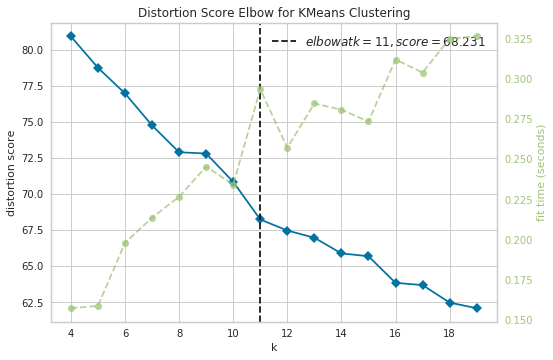

In [233]:
from sklearn.cluster import KMeans
model = KMeans()
visualizer = KElbowVisualizer(model, k=(4,20))
visualizer.fit(london_clustering)
visualizer.show() 

#### The k value is 11

In [257]:
kclusters = 11
london_grouped_clusters = result_grouped.drop('Street', 1)
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clusters)
kmeans.labels_[0:10]

array([3, 3, 8, 9, 4, 3, 7, 8, 2, 2], dtype=int32)

In [273]:
final=pd.merge(london_sp_grouped2,venues_sorted,on=['Street'])

In [274]:
final

,Street,Price,Lat,Long,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ABBEY PARADE,London",251500.0,51.531393,-0.292546,Indian Restaurant,Italian Restaurant,English Restaurant,Fast Food Restaurant,Fish & Chips Shop,Metro Station,Mediterranean Restaurant,Hardware Store,Pub,Hotel
1,"ABBEYFIELDS CLOSE,London",240000.0,51.533238,-0.282732,Grocery Store,Food,Laundry Service,Furniture / Home Store,Middle Eastern Restaurant,Health & Beauty Service,Bar,Farmers Market,Ethiopian Restaurant,Event Service
2,"ABBOTTS CRESCENT,London",297000.0,51.614652,0.006466,Grocery Store,Coffee Shop,Zoo Exhibit,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant
3,"ABINGER GROVE,London",263000.0,51.482439,-0.032170,Pub,Vietnamese Restaurant,Fish & Chips Shop,Fast Food Restaurant,Restaurant,Platform,Art Gallery,Park,Fish Market,Eastern European Restaurant
4,"ACKLINGTON DRIVE,London",274000.0,51.603490,-0.250432,Park,Gym,Business Service,Pizza Place,Zoo Exhibit,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
5,"ADDINGTON STREET,London",279881.0,51.501084,-0.115997,Coffee Shop,Hotel,Bar,Sandwich Place,Café,Japanese Restaurant,Bakery,Movie Theater,Korean Restaurant,Gift Shop
6,"ADINE ROAD,London",230000.0,51.522259,0.023987,Café,Gym,Gym / Fitness Center,Bus Station,Grocery Store,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space
7,"ADMIRAL SEYMOUR ROAD,London",275000.0,51.459348,0.052453,Grocery Store,Indian Restaurant,Bus Stop,Restaurant,Pizza Place,Garden,Rugby Pitch,Farm,English Restaurant,Ethiopian Restaurant
8,"AERODROME ROAD,London",282500.0,51.595899,-0.246063,Bus Stop,Supermarket,Gym / Fitness Center,Chinese Restaurant,Café,Metro Station,Coffee Shop,Grocery Store,Boarding House,Fast Food Restaurant
9,"AEROVILLE,London",212000.0,51.596887,-0.250829,Supermarket,Coffee Shop,Grocery Store,Gym / Fitness Center,Metro Station,Pizza Place,Park,Fish & Chips Shop,Financial or Legal Service,English Restaurant


In [275]:
final['Cluster Labels']=kmeans.labels_
final.head()

,Street,Price,Lat,Long,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
0,"ABBEY PARADE,London",251500.0,51.531393,-0.292546,Indian Restaurant,Italian Restaurant,English Restaurant,Fast Food Restaurant,Fish & Chips Shop,Metro Station,Mediterranean Restaurant,Hardware Store,Pub,Hotel,3
1,"ABBEYFIELDS CLOSE,London",240000.0,51.533238,-0.282732,Grocery Store,Food,Laundry Service,Furniture / Home Store,Middle Eastern Restaurant,Health & Beauty Service,Bar,Farmers Market,Ethiopian Restaurant,Event Service,3
2,"ABBOTTS CRESCENT,London",297000.0,51.614652,0.006466,Grocery Store,Coffee Shop,Zoo Exhibit,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,8
3,"ABINGER GROVE,London",263000.0,51.482439,-0.032170,Pub,Vietnamese Restaurant,Fish & Chips Shop,Fast Food Restaurant,Restaurant,Platform,Art Gallery,Park,Fish Market,Eastern European Restaurant,9
4,"ACKLINGTON DRIVE,London",274000.0,51.603490,-0.250432,Park,Gym,Business Service,Pizza Place,Zoo Exhibit,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,4


#### Clustering and plotting in map

In [276]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
markers_colors = []
for lat, lon, poi, cluster in zip(final['Lat'], final['Long'], final['Street'], final['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
map_clusters

## Exploring the different clusters

In [312]:
final.loc[final['Cluster Labels'] == 0, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
44,"BELVEDERE STRAND,London",250000.000000,Convenience Store,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,0
45,"BELVOIR CLOSE,London",228500.000000,Park,Bar,Convenience Store,Pet Store,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,0
48,"BERTRAND WAY,London",273500.000000,Convenience Store,Sports Club,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,0
65,"BRAEMAR AVENUE,London",256000.000000,Convenience Store,Recreation Center,River,Park,Zoo Exhibit,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,0
100,"CARISBROOKE ROAD,London",293000.000000,Convenience Store,Park,Construction & Landscaping,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,0
142,"COURTLAND GROVE,London",280000.000000,Grocery Store,Convenience Store,Soccer Field,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,0
148,"CURTIS FIELD ROAD,London",290000.000000,Convenience Store,Food & Drink Shop,Trail,French Restaurant,Zoo Exhibit,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,0
154,"DENNETTS ROAD,London",297000.000000,Convenience Store,Pub,Bus Stop,Fried Chicken Joint,Pizza Place,Whisky Bar,Chinese Restaurant,Hungarian Restaurant,English Restaurant,Ethiopian Restaurant,0
170,"EASTGATE CLOSE,London",220000.000000,Convenience Store,Grocery Store,Italian Restaurant,Fast Food Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,0
195,"FISHGUARD WAY,London",280000.000000,Harbor / Marina,Park,Convenience Store,Waterfront,Farmers Market,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,0


In [313]:
final.loc[final['Cluster Labels'] == 1, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
15,"ALLEN ROAD,London",255000.0,Construction & Landscaping,Convenience Store,Pharmacy,Café,Zoo Exhibit,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,1
122,"CHURCHBURY ROAD,London",300000.0,Construction & Landscaping,Soccer Field,Zoo Exhibit,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,1
194,"FIRS LANE,London",258397.0,Soccer Field,Zoo Exhibit,Cosmetics Shop,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,1
230,"GREGORY CRESCENT,London",280000.0,Construction & Landscaping,Scenic Lookout,Zoo Exhibit,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,1
259,"HEXAL ROAD,London",250000.0,Construction & Landscaping,Whisky Bar,History Museum,Zoo Exhibit,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,1
326,"LYME FARM ROAD,London",230000.0,Rugby Pitch,Recreation Center,Gym / Fitness Center,Soccer Field,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,1
349,"MILFORD CLOSE,London",235000.0,Construction & Landscaping,Furniture / Home Store,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,1
433,"ROWLANDS CLOSE,London",300000.0,Construction & Landscaping,Bus Stop,Miscellaneous Shop,Soccer Field,Discount Store,Rugby Pitch,Zoo Exhibit,Farmers Market,Ethiopian Restaurant,Event Service,1
434,"SAMUEL CLOSE,London",225000.0,Rugby Pitch,Eastern European Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,1
443,"SEWARDSTONE GARDENS,London",287000.0,Construction & Landscaping,Reservoir,Café,Zoo Exhibit,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,1


In [314]:
final.loc[final['Cluster Labels'] == 2, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
8,"AERODROME ROAD,London",282500.0,Bus Stop,Supermarket,Gym / Fitness Center,Chinese Restaurant,Café,Metro Station,Coffee Shop,Grocery Store,Boarding House,Fast Food Restaurant,2
9,"AEROVILLE,London",212000.0,Supermarket,Coffee Shop,Grocery Store,Gym / Fitness Center,Metro Station,Pizza Place,Park,Fish & Chips Shop,Financial or Legal Service,English Restaurant,2
18,"AMBASSADOR GARDENS,London",244500.0,Supermarket,Fast Food Restaurant,Pub,Hotel,Bus Station,Gym / Fitness Center,Soccer Field,Farm,English Restaurant,Ethiopian Restaurant,2
58,"BOLTON ROAD,London",287250.0,Breakfast Spot,Train Station,Supermarket,Platform,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,2
86,"BUCHANAN CLOSE,London",300000.0,Indian Restaurant,Supermarket,Lake,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,2
89,"BUTTERFIELD SQUARE,London",215000.0,Supermarket,Light Rail Station,Bus Station,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,2
91,"CALLANDER ROAD,London",215000.0,Chinese Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,2
98,"CAPITOL WAY,London",259250.0,Supermarket,Chinese Restaurant,Auto Garage,Park,Grocery Store,Gym / Fitness Center,Korean Restaurant,Sandwich Place,Fast Food Restaurant,Pub,2
161,"DOLLIS AVENUE,London",207500.0,Restaurant,Supermarket,Turkish Restaurant,Seafood Restaurant,Pub,Cosmetics Shop,Gym Pool,Gym / Fitness Center,Bus Stop,Japanese Restaurant,2
167,"DUNNOCK ROAD,London",225000.0,Trail,Supermarket,Donut Shop,Bus Stop,Zoo Exhibit,Fast Food Restaurant,Event Service,Event Space,Exhibit,Factory,2


In [315]:
final.loc[final['Cluster Labels'] == 3, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
0,"ABBEY PARADE,London",251500.000000,Indian Restaurant,Italian Restaurant,English Restaurant,Fast Food Restaurant,Fish & Chips Shop,Metro Station,Mediterranean Restaurant,Hardware Store,Pub,Hotel,3
1,"ABBEYFIELDS CLOSE,London",240000.000000,Grocery Store,Food,Laundry Service,Furniture / Home Store,Middle Eastern Restaurant,Health & Beauty Service,Bar,Farmers Market,Ethiopian Restaurant,Event Service,3
5,"ADDINGTON STREET,London",279881.000000,Coffee Shop,Hotel,Bar,Sandwich Place,Café,Japanese Restaurant,Bakery,Movie Theater,Korean Restaurant,Gift Shop,3
10,"AGATE CLOSE,London",220000.000000,Hotel,Rafting,Restaurant,Farm,Light Rail Station,Chinese Restaurant,Coffee Shop,Pub,Czech Restaurant,Farmers Market,3
12,"ALBYN ROAD,London",285000.000000,Food Truck,Library,Café,Grocery Store,Gym,Gym / Fitness Center,Pet Store,Coffee Shop,Supermarket,River,3
13,"ALDEBURGH STREET,London",295000.000000,Clothing Store,Sporting Goods Shop,Pub,Scandinavian Restaurant,Supermarket,Furniture / Home Store,Fast Food Restaurant,Doner Restaurant,Park,Discount Store,3
14,"ALL SAINTS CLOSE,London",255000.000000,Portuguese Restaurant,Convenience Store,Pub,Grocery Store,Gym / Fitness Center,Coffee Shop,Park,Fish & Chips Shop,Gastropub,Post Office,3
16,"ALTMORE AVENUE,London",286300.000000,Indian Restaurant,Fast Food Restaurant,Supermarket,Sandwich Place,Bakery,Coffee Shop,Bus Station,Optical Shop,Furniture / Home Store,Electronics Store,3
17,"ALWYN GARDENS,London",247500.000000,Coffee Shop,Pub,Gym / Fitness Center,Bus Stop,Student Center,Sushi Restaurant,Japanese Restaurant,Fried Chicken Joint,Farmers Market,Ethiopian Restaurant,3
22,"ANDREWS PLACE,London",200000.000000,Chinese Restaurant,Indian Restaurant,Sports Club,Hardware Store,Soccer Field,Farm,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,3


In [316]:
final.loc[final['Cluster Labels'] == 4, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
4,"ACKLINGTON DRIVE,London",274000.0,Park,Gym,Business Service,Pizza Place,Zoo Exhibit,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,4
19,"AMPLEFORTH ROAD,London",275000.0,Park,Pub,Lake,Supermarket,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,4
28,"ARDENT CLOSE,London",210000.0,Park,Construction & Landscaping,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,4
34,"BAILEY CLOSE,London",251275.0,Park,Pizza Place,Grocery Store,Flower Shop,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,4
120,"CHINGFORD AVENUE,London",276000.0,Park,Pub,Pizza Place,Zoo Exhibit,Farmers Market,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,4
135,"CONISCLIFFE ROAD,London",239084.0,Park,Sports Club,Pizza Place,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,4
233,"GROVEBURY ROAD,London",280500.0,Park,Supermarket,Pub,Cricket Ground,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,4
312,"LINCOLN CLOSE,London",235000.0,Park,Grocery Store,Food Service,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,4
334,"MARATHON WAY,London",223000.0,Park,Laundry Service,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,4
338,"MARTINS PLACE,London",222000.0,Park,Pub,Grocery Store,Pizza Place,Zoo Exhibit,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,4


In [317]:
final.loc[final['Cluster Labels'] == 5, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
31,"ASHMORE ROAD,London",225654.5,Bus Stop,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,5
53,"BIRKDALE CLOSE,London",262500.0,Bus Stop,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,5


In [318]:
final.loc[final['Cluster Labels'] == 6, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
23,"ANERLEY STATION ROAD,London",297000.0,Pub,Train Station,Gas Station,Park,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,6
32,"AVON ROAD,London",232500.0,Rugby Pitch,Bus Stop,History Museum,Park,Zoo Exhibit,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,6
43,"BELL DRIVE,London",275000.0,Gym,Bus Stop,Scenic Lookout,Park,Zoo Exhibit,Farm,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,6
59,"BORLAND ROAD,London",204000.0,Park,Pub,Theater,Bus Stop,Thai Restaurant,Farmers Market,Ethiopian Restaurant,Event Service,Event Space,Exhibit,6
68,"BRANDON ESTATE,London",253000.0,Café,Park,Pub,Bakery,Grocery Store,Performing Arts Venue,Bike Rental / Bike Share,Tailor Shop,Fast Food Restaurant,Chinese Restaurant,6
69,"BRAY ROAD,London",260000.0,Metro Station,Gym / Fitness Center,Bus Stop,Park,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,6
71,"BREWSTER ROAD,London",200000.0,Park,Ice Cream Shop,Fried Chicken Joint,Coffee Shop,Farm,Asian Restaurant,Hotel,Convenience Store,Cricket Ground,Indian Restaurant,6
73,"BRIDGE MEADOWS,London",238375.0,Park,Café,Train Station,Soccer Stadium,Food,Farm,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,6
76,"BRITTON CLOSE,London",230000.0,Coffee Shop,Grocery Store,Park,Gym / Fitness Center,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,6
83,"BROOKLYN AVENUE,London",290000.0,Pub,Photography Studio,Tram Station,Park,Flea Market,Fishing Store,Eastern European Restaurant,Electronics Store,English Restaurant,Food,6


In [319]:
final.loc[final['Cluster Labels'] == 7, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
6,"ADINE ROAD,London",230000.000000,Café,Gym,Gym / Fitness Center,Bus Station,Grocery Store,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,7
11,"ALAN HOCKEN WAY,London",260000.000000,Platform,Rugby Pitch,Café,Fish & Chips Shop,Trail,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,7
20,"ANCONA ROAD,London",239000.000000,Platform,Coffee Shop,Grocery Store,Romanian Restaurant,Pub,Hostel,Plaza,Thai Restaurant,Pizza Place,Spanish Restaurant,7
38,"BARROWFIELD CLOSE,London",270000.000000,Hotel,Turkish Restaurant,Café,Mediterranean Restaurant,Zoo Exhibit,Fast Food Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,7
77,"BROADHEAD STRAND,London",291666.666667,History Museum,Café,Park,Pub,Supermarket,Gift Shop,Gym / Fitness Center,Museum,Deli / Bodega,Filipino Restaurant,7
81,"BROOKEHOWSE ROAD,London",225000.000000,Shipping Store,Train Station,Dance Studio,Hardware Store,Farm,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,7
94,"CAMBRIDGE PARK,London",216875.000000,Café,Thai Restaurant,Indian Restaurant,Italian Restaurant,Garden,German Restaurant,Liquor Store,Harbor / Marina,Historic Site,Park,7
111,"CHANDLER WAY,London",253000.000000,Café,Indian Restaurant,Lake,Garden,Gay Bar,Skate Park,Chinese Restaurant,Park,Building,Convenience Store,7
126,"CLIFFORD AVENUE,London",215000.000000,Platform,Train Station,Zoo Exhibit,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,7
146,"CROWTHER ROAD,London",282142.000000,Platform,Park,Café,Supermarket,Gym / Fitness Center,Train Station,Asian Restaurant,Grocery Store,Sports Bar,Pub,7


In [320]:
final.loc[final['Cluster Labels'] == 8, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
2,"ABBOTTS CRESCENT,London",297000.000000,Grocery Store,Coffee Shop,Zoo Exhibit,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,8
7,"ADMIRAL SEYMOUR ROAD,London",275000.000000,Grocery Store,Indian Restaurant,Bus Stop,Restaurant,Pizza Place,Garden,Rugby Pitch,Farm,English Restaurant,Ethiopian Restaurant,8
56,"BLITHDALE ROAD,London",240000.000000,Grocery Store,Playground,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,8
60,"BOSTALL LANE,London",294000.000000,Grocery Store,Playground,Campground,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,8
61,"BOTELEY CLOSE,London",287500.000000,Grocery Store,Nature Preserve,Pharmacy,Furniture / Home Store,Farmers Market,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,8
66,"BRAIDWOOD ROAD,London",248000.000000,Grocery Store,Coffee Shop,Recreation Center,Fried Chicken Joint,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,8
82,"BROOKHILL ROAD,London",280000.000000,Grocery Store,Bus Stop,Chinese Restaurant,Fish & Chips Shop,Middle Eastern Restaurant,Child Care Service,Indian Restaurant,Farm,English Restaurant,Ethiopian Restaurant,8
87,"BUCK LANE,London",276250.000000,Indian Restaurant,Hookah Bar,Office,Park,Playground,Grocery Store,Dance Studio,Cuban Restaurant,Event Service,Event Space,8
95,"CAMBUS ROAD,London",239841.666667,Grocery Store,Fast Food Restaurant,Pub,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,8
105,"CEDAR COURT,London",255000.000000,Grocery Store,Indian Restaurant,Platform,Gym,Train Station,Gym / Fitness Center,Park,Coffee Shop,Chinese Restaurant,Pub,8


In [321]:
final.loc[final['Cluster Labels'] ==9, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
3,"ABINGER GROVE,London",263000.000000,Pub,Vietnamese Restaurant,Fish & Chips Shop,Fast Food Restaurant,Restaurant,Platform,Art Gallery,Park,Fish Market,Eastern European Restaurant,9
21,"ANDERSON ROAD,London",285000.000000,Pub,Café,Coffee Shop,Supermarket,Beer Store,Fish & Chips Shop,Park,Butcher,Recording Studio,Coffee Roaster,9
37,"BARRATT AVENUE,London",270000.000000,Pub,Fast Food Restaurant,Indian Restaurant,Hotel Bar,Café,Train Station,Performing Arts Venue,Gastropub,Bar,Mediterranean Restaurant,9
52,"BIRD IN HAND PASSAGE,London",268250.000000,Pub,Coffee Shop,Gym / Fitness Center,Café,Grocery Store,Gastropub,Bar,Bus Stop,Fish & Chips Shop,Platform,9
62,"BOULTWOOD ROAD,London",200000.000000,Pub,Airport Terminal,Donut Shop,Light Rail Station,Food,Farmers Market,Ethiopian Restaurant,Event Service,Event Space,Food Court,9
85,"BRUCE GROVE,London",240000.000000,Pub,Café,Italian Restaurant,Gym / Fitness Center,Train Station,Supermarket,Middle Eastern Restaurant,Social Club,Fast Food Restaurant,Turkish Restaurant,9
92,"CAMBRIDGE DRIVE,London",295000.000000,Pub,Café,Supermarket,Kebab Restaurant,Rugby Pitch,Pharmacy,Italian Restaurant,Gift Shop,Bus Stop,Financial or Legal Service,9
108,"CHADWELL LANE,London",200000.000000,Pub,Bakery,Farmers Market,Gastropub,Convenience Store,Construction & Landscaping,Thai Restaurant,Bistro,Supermarket,Pizza Place,9
149,"CURWEN AVENUE,London",260000.000000,Pub,Grocery Store,Train Station,Market,Restaurant,Café,Chinese Restaurant,Falafel Restaurant,Electronics Store,English Restaurant,9
151,"DARTMOUTH PLACE,London",200000.000000,Pub,Coffee Shop,Gym / Fitness Center,Café,Train Station,Bar,Gastropub,Bus Stop,Platform,Pizza Place,9


In [322]:
final.loc[final['Cluster Labels'] == 10, final.columns[[0]+ [1]+ list(range(4, final.shape[1]))]]

,Street,Price,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Cluster Labels
261,"HIGH POINT,London",299995.0,Hotel,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,10
315,"LINKSWAY,London",295000.0,Hotel,Zoo Exhibit,Filipino Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,10
484,"STONELEIGH ROAD,London",205000.0,Hotel,Tunnel,Zoo Exhibit,Fast Food Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,10


## Results and Discussion Section

First of all, even though the London Housing Market may get dull but it is still an "ever-green" for business affairs.

But by using the above approach we have found the following observation and can recommend the customers based on these:-

    1)Cluster 0 is mainly focused for customers that have convenient store and love parks as observed in the 1st and 2nd most common venue.
    2)Cluster 1 is for poeple who are in the business of home renovations.
    3)Cluster 2 is surrounded bydifferent kinds of restaurants ,stores and also closeby Gyms.
    4)Cluster 3 has a good combination of pubs,restaruants and also good for people who are into Gym and also have recreations place like Go Kart etc.
    5)Cluster 4 is good for people who like park and also variety of other venues like pubs,cafe etc.
    6)Cluster 5 is good for people who like to visit zoos and also have convenient public transport.
    7)Cluster 6 is good for people who like to have a walk in the park and also for people who like yoga or going to Gym.
    8)Cluster 7 is good for people who commute a lot using public transport.
    9)Cluster 8 is good for people who like Grocery store to easily buy home supplies and also have closeby train stations and bus stops.
    10)Cluster 9 is good for people who like to go to Pubs and also enjoy various varieties of foods.
    11)Cluster 10 is convenient for people who are foodies and like to enjoy various varieties of foods.
    
By using these observations one can make a good investment and have a wide range of amenites which are convenient to him/her.

## Conclusion

To sum up,Due to COVID-19 the prices of the real estate/property have been affected significantly.It is fairly clear that with massive unemployment, wage cuts, business failures, and job uncertainty, many people are likely to be cautious about making the biggest investment of their lives - buying a home. 
This project was focused on how we can leverage machine learning tools to help the customers as well as the realtor to choose a house/estate that is convenient and worth the investment being made.

To solve this business problem, we clustered London neighborhoods in order to recommend venues and the current average price of real estate where buyers can make a real estate investment. We recommended profitable venues according to amenities and essential facilities surrounding such venues i.e. elementary schools, high schools, hospitals & grocery stores.

First we gathered data on London properties and the relative price paid data from the HM Land Registry (http://landregistry.data.gov.uk/). The following fields comprise the address data included in Price Paid Data: Postcode; PAON Primary Addressable Object Name. Typically the house number or name; SAON Secondary Addressable Object Name. If there is a sub-building, for example, the building is divided into flats, there will be a SAON; Street; Locality; Town/City; District; County.
To explore and target the recommended locations across different venues according to the presence of amenities and essential facilities, we will access data through FourSquare API interface and arrange them as a dataframe for visualization. By merging data on London properties and the relative price paid data from the HM Land Registry and data on amenities and essential facilities surrounding such properties from FourSquare API interface, we will be able to recommend relevant and profitable real estate investments.

Second, the methodology comprised of four stages:-
    1. Collect Inspection Data
    2. Explore and Understand Data
    3. Data preparation and preprocessing
    4. Modeling,we used the k-means clustering technique as it is fast and efficient in terms of computational cost, is highly flexible to account for mutations in real estate market in London and is accurate.
    
Finally,we drew conclusions based on our approach and were able to split them into seperate clusters and provided a good distribution for various needs of the buyer based on the surrounding amenites and facilities